In [2]:
import os

os.makedirs('/root/.kaggle', exist_ok=True)

source_path = '/content/kaggle.json'
destination_path = '/root/.kaggle/kaggle.json'

if os.path.exists(source_path):
    try:
        os.rename(source_path, destination_path)
        print(f'Moved {source_path} to {destination_path}')
    except OSError as e:
        print(f'An error occurred: {e}')
else:
    print(f'{source_path} does not exist')


os.chmod('/root/.kaggle/kaggle.json', 0o600)


Moved /content/kaggle.json to /root/.kaggle/kaggle.json


In [3]:
#Import dataset from kaggle
import kaggle

api = kaggle.KaggleApi()
api.authenticate()

dataset_name = 'sadmansakibmahi/plant-disease-expert'
download_path = './Image Data base'

api.dataset_download_files(dataset_name, path=download_path)

In [4]:
import zipfile

zip_path = os.path.join(download_path, 'plant-disease-expert.zip')
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(download_path)


In [5]:
import os

data_path = '/content/Image Data base/Image Data base/Image Data base'
image_paths = [] # List to store paths of images
labels = [] # List to store labels of images

# Iterate through folders, assuming each folder name is a class label
for class_name in os.listdir(data_path):
    class_path = os.path.join(data_path, class_name)
    if os.path.isdir(class_path):
        for image_name in os.listdir(class_path):
            image_paths.append(os.path.join(class_path, image_name))
            labels.append(class_name)


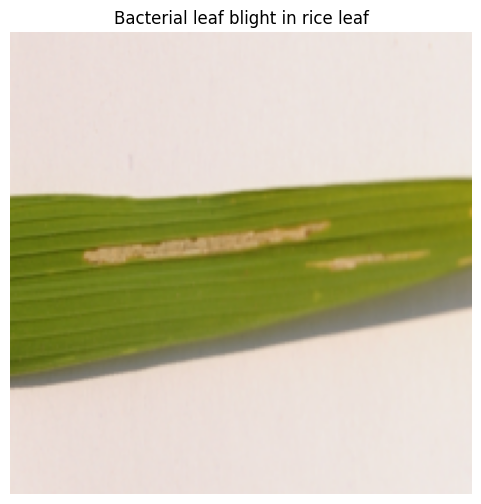

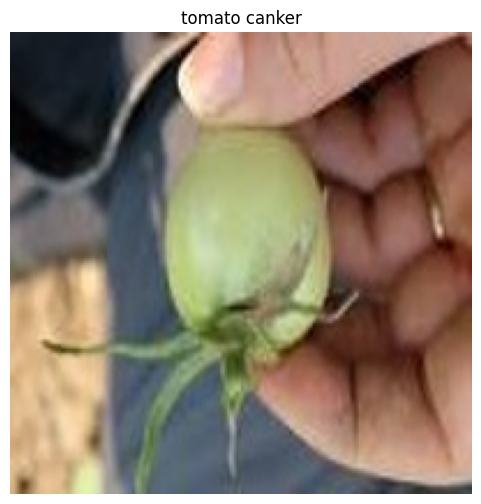

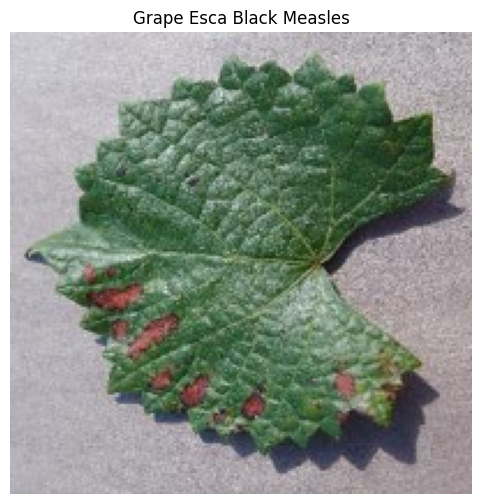

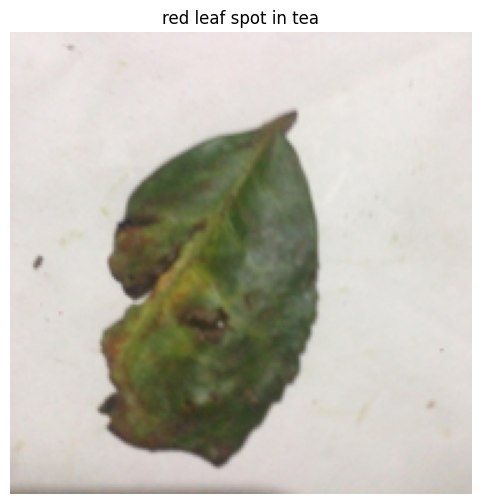

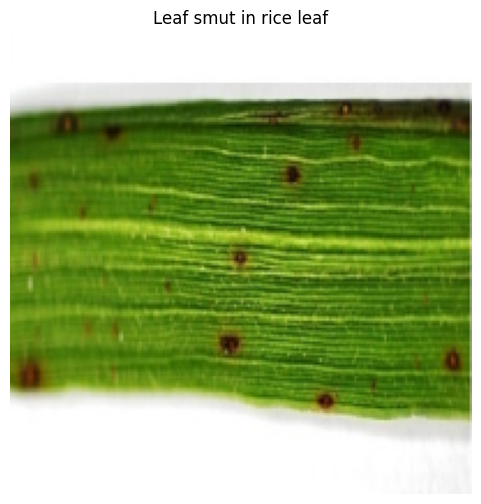

...

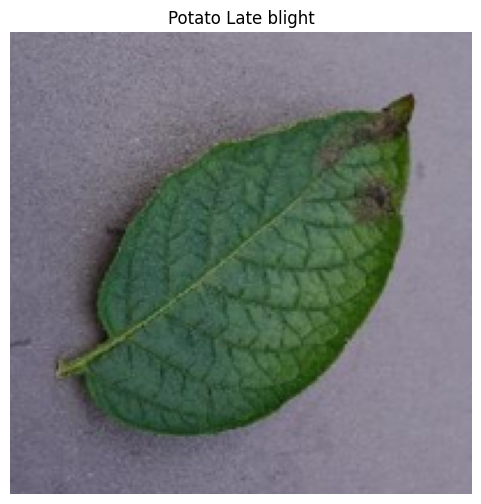

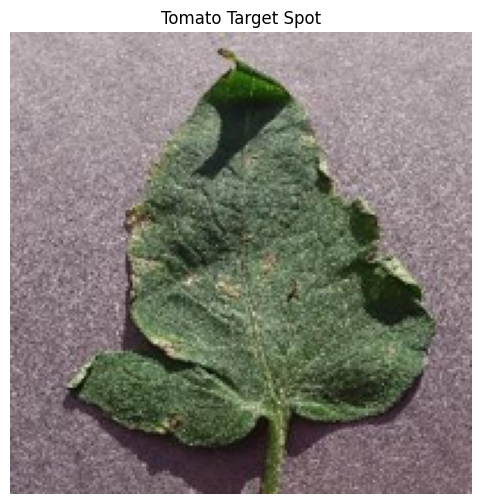

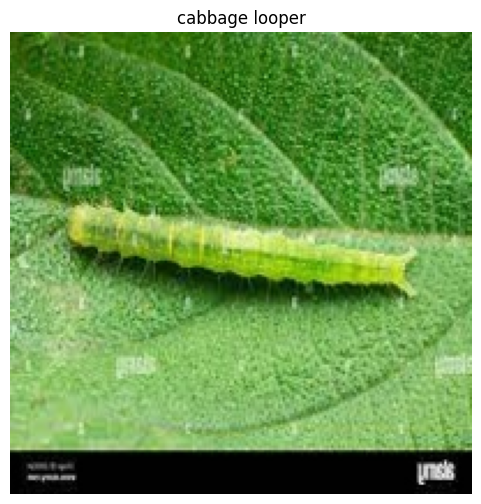

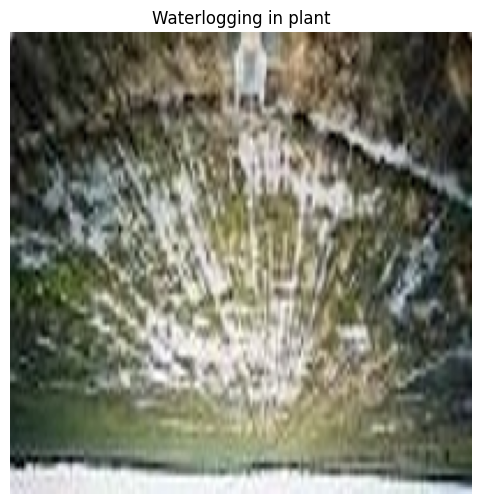

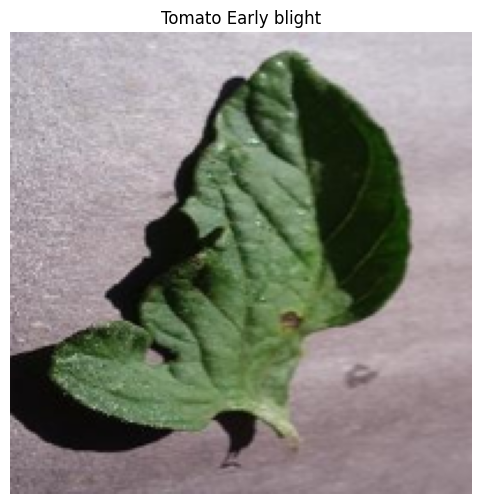

In [6]:
import matplotlib.pyplot as plt
from PIL import Image
import random

unique_classes = list(set(labels))
image_size_to_display = (200, 200) # You can adjust this size

for class_name in unique_classes:
    selected_images = [image for image, label in zip(image_paths, labels) if label == class_name]
    random_sample = random.choice(selected_images) # Select one random sample

    image = Image.open(random_sample)
    image_resized = image.resize(image_size_to_display) # Resize the image for better visibility

    plt.figure(figsize=(6, 6)) # Set a large figure size, you can adjust this
    plt.imshow(image_resized)
    plt.axis('off')
    plt.title(class_name)
    plt.show()


In [7]:
from collections import Counter

class_counts = Counter(labels)
for class_name, count in class_counts.items():
    print(f'{class_name}: {count} images')


Strawberry healthy: 1095 images
Tomato Spider mites Two spotted spider mite: 5028 images
Grape Esca Black Measles: 13284 images
Pepper bell Bacterial spot: 2988 images
tomato canker: 57 images
ginger: 135 images
Bacterial leaf blight in rice leaf: 120 images
Apple Apple scab: 6048 images
Apple Black rot: 5964 images
Strawberry Leaf scorch: 2664 images
Gray Leaf Spot in corn Leaf: 1722 images
brown blight in tea: 339 images
Tomato Septoria leaf spot: 5313 images
Potato Early blight: 3000 images
healthy tea leaf: 222 images
Tomato Leaf Mold: 2856 images
Grape Black rot: 11328 images
Common Rust in corn Leaf: 3918 images
Tomato Bacterial spot: 6381 images
Apple Cedar apple rust: 2640 images
Tomato healthy: 3819 images
Cherry (including_sour) healthy: 2052 images
Raspberry healthy: 891 images
potassium deficiency in plant: 54 images
Pepper bell healthy: 3549 images
bird eye spot in tea: 300 images
Peach healthy: 864 images
Apple healthy: 3948 images
Cherry (including sour) Powdery mildew: 

In [9]:
# from PIL import Image
# import numpy as np

# image_size = (64, 64) # You can change this to the desired size
# data_matrix = []

# for image_path in image_paths:
#     image = Image.open(image_path)
#     image_resized = image.resize(image_size).convert('L') # Resize and convert to grayscale
#     image_vector = np.array(image_resized).flatten()
#     data_matrix.append(image_vector)

# data_matrix = np.array(data_matrix)


In [10]:
# from sklearn.decomposition import PCA

# pca = PCA(n_components=2) # Reduce to 2 dimensions
# reduced_data = pca.fit_transform(data_matrix)


In [11]:
# import matplotlib.pyplot as plt

# plt.figure(figsize=(10, 10)) # Set a larger figure size

# for class_name in unique_classes:
#     class_data = [point for point, label in zip(reduced_data, labels) if label == class_name]
#     class_data = np.array(class_data)
#     plt.scatter(class_data[:, 0], class_data[:, 1], label=class_name)

# plt.legend()
# plt.xlabel('Principal Component 1')
# plt.ylabel('Principal Component 2')
# plt.title('PCA Visualization')
# plt.show()

In [12]:
# !pip install tensorflow_model_optimization

In [13]:
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# import tensorflow as tf
# import tensorflow_model_optimization as tfmot

# tf.keras.backend.clear_session()
# tf.random.set_seed(1234)



# # Data augmentation and preprocessing for training
# train_datagen = ImageDataGenerator(rescale=1./255,
#                                    validation_split=0.2, # Reserve 20% for validation
#                                    rotation_range=20,
#                                    width_shift_range=0.2,
#                                    height_shift_range=0.2,
#                                    shear_range=0.2,
#                                    zoom_range=0.2,
#                                    horizontal_flip=True,
#                                    fill_mode='nearest')

# # Training data
# train_generator = train_datagen.flow_from_directory('/content/Image Data base/Image Data base/Image Data base',
#                                                     target_size=(128, 128),
#                                                     batch_size=32,
#                                                     class_mode='categorical',
#                                                     subset='training') # Training subset

# # Validation data
# validation_generator = train_datagen.flow_from_directory('/content/Image Data base/Image Data base/Image Data base',
#                                                          target_size=(128, 128),
#                                                          batch_size=32,
#                                                          class_mode='categorical',
#                                                          subset='validation') # Validation subset

# # MobileNet as a lightweight model
# model = tf.keras.applications.MobileNetV2(input_shape=(128, 128, 3), alpha=1.0, include_top=True,
#                                           weights=None, classes=len(unique_classes))

# # Compile the model
# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Train the model
# model.fit(train_generator, epochs=10) # You can adjust the number of epochs

# # Save the full model
# model.save('full_model.h5')

# # Apply pruning
# prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude


In [14]:
# # Evaluate the original model
# original_eval = model.evaluate(validation_generator)
# print("Original Model - Loss:", original_eval[0], "Accuracy:", original_eval[1])

In [15]:
import json
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation and preprocessing for training
train_datagen = ImageDataGenerator(rescale=1./255,
                                   validation_split=0.2) # same as your training settings

# Training data
train_generator = train_datagen.flow_from_directory('/content/Image Data base/Image Data base/Image Data base',
                                                    target_size=(128, 128),
                                                    batch_size=32,
                                                    class_mode='categorical',
                                                    subset='training') # same as your training settings

class_indices = train_generator.class_indices
index_to_class = {v: k for k, v in class_indices.items()}

# Save to JSON file
with open('class_indices.json', 'w') as f:
    json.dump(index_to_class, f)

print("Class indices saved to class_indices.json")


Found 159755 images belonging to 58 classes.
Class indices saved to class_indices.json
